In [1]:
import pandas as pd
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import datetime
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import re
import math
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances

In [2]:
data = pd.read_csv('C:/Users/gulie/data.csv')
genre = pd.read_csv('C:/Users/gulie/data_w_genres.csv')
by_genre = pd.read_csv('C:/Users/gulie/data_by_genres.csv')
#by_artist = pd.read_csv('C:/Users/gulie/data_by_artist.csv')

In [3]:
data['release_date']= pd.to_datetime(data['release_date'], errors='coerce')
data['year'] = data['release_date'].apply(lambda time: time.year)
data = data[data.year > 1999]


In [4]:
data.to_csv('C:/Users/gulie/data_data.csv')

In [5]:
 data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
15606,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372
15607,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948
15608,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143
15609,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009
15610,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504


In [6]:
data['artists']=data.artists.apply(lambda x: x.strip('[]'))
data['artists']=data.artists.apply(lambda x: x.strip("''"))
#data['artists']=data.artists.apply(lambda x: x.strip(r'[^\w\s]+'))
#genre['artists']=genre.artists.apply(lambda x: x.strip('"" "'))

In [7]:
#all columns in genre dataset removed and only genres and artists remain

data = data.explode("artists",ignore_index=True)
gcolumns = [x for x in genre.columns]

gcolumns = gcolumns[2:]
genre.drop(labels=gcolumns,axis=1,inplace=True)

genre.head()

,genres,artists
0,show tunes,"""Cats"" 1981 Original London Cast"
1,[],"""Cats"" 1983 Broadway Cast"
2,[],"""Fiddler On The Roof” Motion Picture Chorus"
3,[],"""Fiddler On The Roof” Motion Picture Orchestra"
4,[],"""Joseph And The Amazing Technicolor Dreamcoat""..."


In [8]:
# merge genres on artists
data = data.merge(genre,on='artists',how='left')

#remove null and non a number values
def remove_null(L):
    
    if type(L) == float:
        if math.isnan(L):
            return []
    else: 
        return L
data["genres"] = data["genres"].apply(remove_null)

In [9]:
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,genres
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372,"permanent wave, pop"
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948,"atl hip hop, dirty south rap, hip hop, rap, so..."
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143,"alternative metal, nu metal, post-grunge, rap ..."
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009,"alternative metal, nu metal, pop rock, post-gr..."
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504,"detroit hip hop, hip hop, rap"


In [10]:
print(data['id'].info())

<class 'pandas.core.series.Series'>
Int64Index: 41450 entries, 0 to 41449
Series name: id
Non-Null Count  Dtype 
--------------  ----- 
41450 non-null  object
dtypes: object(1)
memory usage: 647.7+ KB
None


In [11]:
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,genres
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372,"permanent wave, pop"
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948,"atl hip hop, dirty south rap, hip hop, rap, so..."
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143,"alternative metal, nu metal, post-grunge, rap ..."
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009,"alternative metal, nu metal, pop rock, post-gr..."
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504,"detroit hip hop, hip hop, rap"


In [12]:
by_genre.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [13]:
c = 50
scaling = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters = c))])
X = by_genre.select_dtypes(np.number)
scaling.fit(X)
scaling = scaling.predict(X)
by_genre['cluster_genre'] = scaling

C:\Users\gulie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\gulie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.004s...
[t-SNE] Computed neighbors for 2973 samples in 0.207s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.113190
[t-SNE] KL divergence after 1000 iterations: 1.388334


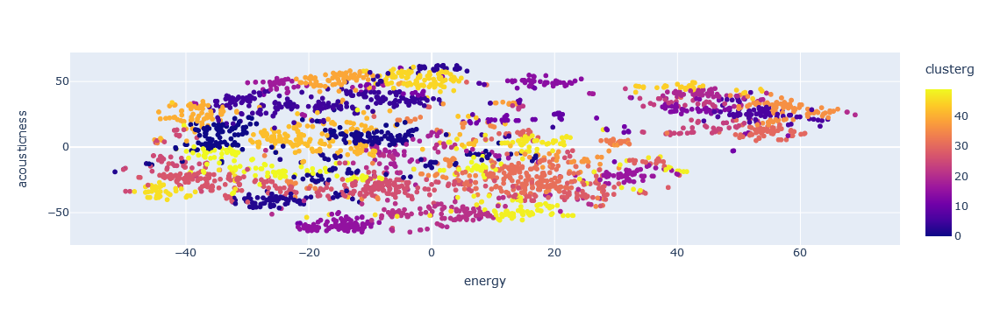

In [14]:
from sklearn.manifold import TSNE

tsne = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_fit = tsne.fit_transform(X)
plot = pd.DataFrame(columns=['energy', 'acousticness'], data=genre_fit)
plot['genre'] = by_genre['genres']
plot['clusterg'] = by_genre['cluster_genre']

fig = px.scatter(
    plot, x='energy', y='acousticness', color='clusterg', hover_data=['energy', 'acousticness', 'genre'])
fig.show()

In [15]:
kmodel = Pipeline([('scaler', StandardScaler()), 
                     ('kmeans', KMeans(n_clusters=c, init='k-means++', random_state= 42))])

y = data.select_dtypes(np.number)
columns = list(y.columns)
kmodel= kmodel.fit(y)
kmodel = kmodel.predict(y)
data['cluster'] = kmodel

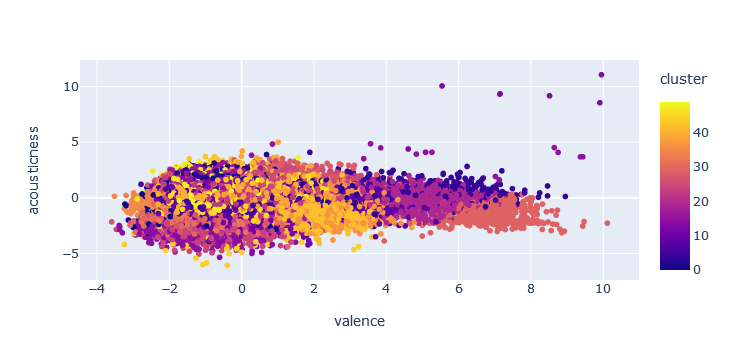

In [16]:
scale = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])

song_fit = scale.fit_transform(y)

scaled = pd.DataFrame(columns=['valence', 'acousticness'], data=song_fit)

scaled['artist'] = data['artists']

scaled['title'] = data['name']

scaled['date'] = data['year']

scaled['cluster'] = data['cluster']

scaled['popular'] = data['popularity']

scaled['tempo'] = data['tempo']

scaled['id'] = data['id']

fig = px.scatter(scaled, x='valence', y='acousticness', color='cluster', hover_data=['valence', 'acousticness', 'artist'])

fig.show()

In [17]:
#Cluster accuracy

kmeans_model = KMeans(n_clusters=c, init='k-means++', random_state= 42).fit(y)

labels = kmeans_model.labels_
silhouette_score(y, labels, metric = 'euclidean')


0.5208762323372356

### Cluster Accuracy using Silhuette Score ↓

<AxesSubplot: >

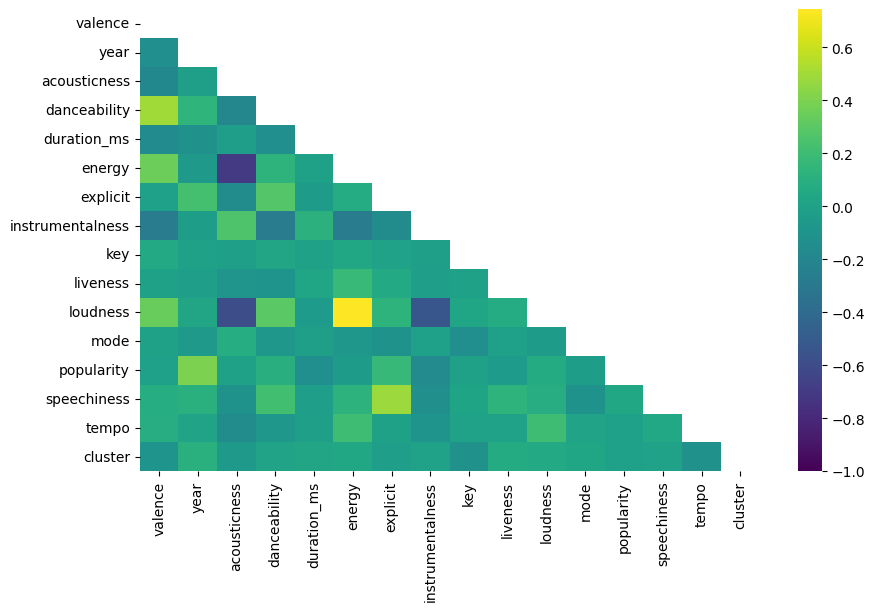

In [18]:
#sample_df = tracks[:20000]

plt.figure(figsize=(10,6))

corr = data.corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,vmin=-1,cmap='viridis',annot=False)
#pd.plotting.scatter_matrix(sample_df[['danceability', 'instrumentalness', 'energy', 'speechiness', 'valence', 'acousticness', ]], figsize=(20,12))


In [19]:
#dfs = scaled[scaled['popular']>45][['title','popular','date', 'cluster', 'tempo', 'acousticness']]
#fig = px.scatter(dfs,y='tempo', x='popular',color='cluster',size='popular')
#fig.show()

In [20]:
#displaying sample songs for each one of the clusters

df = pd.concat([plot,scaled], axis=1).set_index(scaled['cluster']).drop_duplicates()

for cluster in range(c):
    display(df.loc[cluster, ['title','cluster', 'artist', 'date', 'popular']].sample(frac=1).head(5))

,title,cluster,artist,date,popular
cluster,,,,,
0,E.B.A.H.,0,Tech N9ne,2012,50
0,Real,0,"Kendrick Lamar, Anna Wise",2012,54
0,Dammit Man,0,"Piccallo, Pitbull",2004,45
0,Sunflower,0,Rex Orange County,2017,78
0,GAZZILLION EAR,0,"MF DOOM, J Dilla",2009,49


,title,cluster,artist,date,popular
cluster,,,,,
1,Baby I'm Yours,1,"Breakbot, Irfane",2010,62
1,Hoja En Blanco,1,La Tropa Vallenata,2001,55
1,Baja la Tensión,1,Cultura Profética,2010,60
1,Y Hubo Alguien,1,Marc Anthony,2003,55
1,Invisible,1,Clay Aiken,2003,42


,title,cluster,artist,date,popular
cluster,,,,,
2,1983,2,Neon Trees,2010,51
2,Freakish,2,Saves The Day,2001,40
2,Ladies Of Cambridge,2,Vampire Weekend,2007,40
2,Hope in Front of Me,2,Danny Gokey,2014,52
2,Surrender,2,Less Than Jake,2003,39


,title,cluster,artist,date,popular
cluster,,,,,
3,FourFiveSeconds,3,"Rihanna, Kanye West, Paul McCartney",2015,79
3,Bloody Mother Fucking Asshole,3,Martha Wainwright,2005,49
3,The Will To Death,3,John Frusciante,2004,40
3,Feel It Still - Medasin Remix,3,"Portugal. The Man, Medasin",2017,56
3,Slow Cheetah,3,Red Hot Chili Peppers,2006,58


,title,cluster,artist,date,popular
cluster,,,,,
4,"String Quartet No. 2 in G Major, Op. 111: I. A...",4,"Johannes Brahms, The American String Project",2011,0
4,"Clarinet Concerto in A Major, K. 622: 2. Adagio",4,"Wolfgang Amadeus Mozart, Sir Thomas Beecham, R...",2014,47
4,Riviera Paradise,4,Stevie Ray Vaughan,2002,48
4,O Magnum Mysterium: O magnum mysterium,4,"Morten Lauridsen, Chamber Choir Of Europe, Nic...",2006,53
4,Images Of Broken Light,4,Chihei Hatakeyama,2009,44


,title,cluster,artist,date,popular
cluster,,,,,
5,Indigo,5,"88rising, NIKI",2019,67
5,No Me Pidas Perdón,5,Banda MS de Sergio Lizárraga,2014,68
5,"Gone, Gone, Gone",5,Phillip Phillips,2013,68
5,Only in the West,5,Yeek,2017,64
5,Never Really Over,5,Katy Perry,2019,78


,title,cluster,artist,date,popular
cluster,,,,,
6,Why I Love You,6,"JAY-Z, Kanye West, Mr Hudson",2011,55
6,If I Fall,6,Five Finger Death Punch,2007,44
6,Critical Acclaim,6,Avenged Sevenfold,2007,40
6,Frick Park Market,6,Mac Miller,2011,58
6,U Don't Know,6,JAY-Z,2001,42


,title,cluster,artist,date,popular
cluster,,,,,
7,Soco Amaretto Lime,7,Brand New,2001,46
7,That Girl,7,Marques Houston,2003,53
7,Jedd Black,7,John D. Hale Band,2006,42
7,At the Table,7,Josh Garrels,2015,52
7,Huelo a Soledad,7,Ana Gabriel,2001,51


,title,cluster,artist,date,popular
cluster,,,,,
8,I Will Always Love You,8,Dolly Parton,2005,43
8,The Prayer (with Charlotte Church),8,"Josh Groban, Charlotte Church",2001,48
8,On An Evening In Roma (Sott'er Celo De Roma) -...,8,Dean Martin,2006,56
8,Dream,8,Priscilla Ahn,2008,54
8,The holly and the ivy,8,"Traditional, The Cambridge Singers, John Rutter",2003,54


,title,cluster,artist,date,popular
cluster,,,,,
9,Oxygen,9,Dirty Heads,2016,58
9,Solo (Reprise),9,Frank Ocean,2016,62
9,Just For Now,9,Pentatonix,2015,53
9,Baby,9,"Justin Bieber, Ludacris",2010,78
9,my boy,9,Billie Eilish,2017,76


,title,cluster,artist,date,popular
cluster,,,,,
10,Africa,10,TOTO,2010,54
10,Se Me Sigue Notando,10,Chuy Lizarraga y Su Banda Tierra Sinaloense,2013,47
10,Los Años Que Yo Tengo,10,Miguel Y Miguel,2001,50
10,El Disgusto,10,"Ramon Ayala, Cornelio Reyna",2006,53
10,Humpty Dumpty,10,The Countdown Kids,2001,41


,title,cluster,artist,date,popular
cluster,,,,,
11,War,11,"Pop Smoke, Lil Tjay",2019,69
11,Remember You (feat. Blackbear),11,"G-Eazy, blackbear",2014,55
11,"Lemonade (feat. Gunna, Don Toliver & NAV)",11,"Internet Money, Gunna, Don Toliver, NAV",2020,79
11,King Of The Fall,11,The Weeknd,2020,68
11,Phone Numbers,11,"Dominic Fike, Kenny Beats",2019,74


,title,cluster,artist,date,popular
cluster,,,,,
12,2 + 2 = 5,12,Radiohead,2003,56
12,ブルーバード,12,Ikimonogakari,2006,76
12,Survivor / I Will Survive (Glee Cast Version),12,Glee Cast,2012,58
12,Violence (Enough Is Enough),12,A Day To Remember,2013,48
12,I Can't Stop Drinking About You,12,Bebe Rexha,2014,51


,title,cluster,artist,date,popular
cluster,,,,,
13,Dopesmoker,13,Sleep,2003,42
13,Natural White Noise for Babies - Ocean Waves f...,13,One Hour Gulf Coast Ocean Waves,2010,57
13,Aladdin - Storyteller,13,Chuck Riley,2004,42
13,Brown Noise for Sleep,13,Sounds for Life,2009,42
13,Midnight Thunderstorm Part 2,13,"Lightning, Thunder and Rain Storm",2009,43


,title,cluster,artist,date,popular
cluster,,,,,
14,Weight On Me,14,"Sheff G, Sleepy Hallow",2020,65
14,Lost,14,"Chance the Rapper, Noname",2013,56
14,The Code (feat. Polo G),14,"King Von, Polo G",2020,78
14,Dolly (with Lil Uzi Vert),14,"Lil Tecca, Lil Uzi Vert",2020,74
14,(i hope you) miss me,14,Joseph Black,2020,75


,title,cluster,artist,date,popular
cluster,,,,,
15,Rain With Distant Thunderstorm,15,Nature Sounds,2012,47
15,432Hz Miracle Tone: Rainy Days,15,PowerThoughts Meditation Club,2000,41
15,Sleep,15,Godspeed You! Black Emperor,2000,42
15,432Hz Miracle Tone: Raise Positive Vibrations ...,15,PowerThoughts Meditation Club,2000,49
15,The Many Adventures of Winnie the Pooh,15,Christopher Plummer,2004,42


,title,cluster,artist,date,popular
cluster,,,,,
16,Starry Night,16,Chris August,2010,43
16,"Kingdom Dance - From ""Tangled""/Score",16,Alan Menken,2010,53
16,Out Of Exile,16,Audioslave,2005,49
16,Oil and Water,16,Incubus,2006,48
16,Guys Like Me,16,Eric Church,2006,55


,title,cluster,artist,date,popular
cluster,,,,,
17,Me parece,17,Los Acosta,2007,45
17,I Can Dream About You,17,Dan Hartman,2011,53
17,De Antes,17,Cultura Profética,2002,55
17,Open Your Heart,17,Madonna,2009,54
17,Ven Conmigo (Solamente Tú),17,Christina Aguilera,2000,57


,title,cluster,artist,date,popular
cluster,,,,,
18,Old English,18,"Young Thug, A$AP Ferg, Freddie Gibbs",2014,56
18,Mary Go Round,18,"Musiq Soulchild, Osunlade",2000,40
18,Body On Me,18,"Nelly, Ashanti, Akon",2008,45
18,Outro,18,Limp Bizkit,2000,44
18,"Supercalifragilisticexpialidocious - From ""Mar...",18,"Julie Andrews, Dick Van Dyke, The Pearlie Chorus",2013,57


,title,cluster,artist,date,popular
cluster,,,,,
19,I Am A Man Of Constant Sorrow - Instrumental,19,Norman Blake,2000,44
19,Deora Ar Mo Chroí,19,Enya,2000,55
19,Overture,19,"""George Balanchines The Nutcracker"", David Zin...",2005,43
19,Alien Observer,19,Grouper,2011,48
19,Can't Help Falling in Love,19,The Piano Guys,2013,51


,title,cluster,artist,date,popular
cluster,,,,,
20,"Guitars, Cadillacs - 2002 Remaster",20,Dwight Yoakam,2004,40
20,Para Qué Tantos Besos,20,Noel Torres,2014,48
20,No Hay Novedad,20,Los Cadetes De Linares,2016,69
20,Desde El Día Que Te Fuiste,20,"José Manuel Zamacona, José Manuel Zamacona, Jr",2006,43
20,24's (Vocals Only),20,T.I.,2003,54


,title,cluster,artist,date,popular
cluster,,,,,
21,Pouring Rain & Thunder,21,Mother Nature Sound FX,2017,68
21,Drip Drop Sleep,21,Gentle Rain Makers,2017,67
21,Steady Forest Rain,21,Creatress,2020,72
21,Gentle Rain Fall,21,"Rain Sounds, Rainfall, Rain for Deep Sleep, Ra...",2015,66
21,Soothing Waves Sounds,21,Ocean Makers,2017,62


,title,cluster,artist,date,popular
cluster,,,,,
22,Fine Line,22,Harry Styles,2019,78
22,Hands Up,22,NF,2014,55
22,Clean,22,Taylor Swift,2014,52
22,That Was A Crazy Game Of Poker,22,O.A.R.,2016,58
22,Christ In Me,22,Jeremy Camp,2015,55


,title,cluster,artist,date,popular
cluster,,,,,
23,Get Away,23,Earshot,2002,42
23,Post Script,23,Finch,2002,37
23,Love Song,23,Four Year Strong,2009,44
23,I'm Not Gonna Teach Your Boyfriend How to Danc...,23,Black Kids,2008,45
23,Dime,23,Ivy Queen,2010,53


,title,cluster,artist,date,popular
cluster,,,,,
24,We Paid (feat. 42 Dugg),24,"Lil Baby, 42 Dugg",2020,82
24,All In,24,YoungBoy Never Broke Again,2020,72
24,Nice Guy (with Jessie Reyez),24,"Eminem, Jessie Reyez",2018,62
24,Sunday (feat. Frank Ocean),24,"Earl Sweatshirt, Frank Ocean",2013,62
24,So Icy (feat. Young Jeezy),24,"Gucci Mane, Jeezy",2020,41


,title,cluster,artist,date,popular
cluster,,,,,
25,Hellwalker,25,Mick Gordon,2016,56
25,Cavern,25,Liquid Liquid,2008,41
25,Sunspots,25,Nine Inch Nails,2005,42
25,Sun Was High (So Was I),25,Small Black,2010,46
25,Somebody Already Broke My Heart,25,Sade,2000,53


,title,cluster,artist,date,popular
cluster,,,,,
26,"Bounce, Rock, Skate, Roll - Remastered",26,Vaughan Mason and Crew,2011,48
26,"It's On - From ""Camp Rock 2: The Final Jam""",26,"Demi Lovato, Jordan Francis, Meaghan Martin, A...",2010,52
26,Blind - Radio Edit,26,Hercules & Love Affair,2008,59
26,Burning Love,26,Elvis Presley,2002,46
26,Hey Baby,26,"No Doubt, Bounty Killer",2001,53


,title,cluster,artist,date,popular
cluster,,,,,
27,Sails to the Wind,27,Dirty Heads,2012,44
27,Hotel Lobby,27,Pop Smoke,2020,71
27,Bad Bitch (feat. Ty Dolla $ign),27,"Bebe Rexha, Ty Dolla $ign",2017,66
27,On The Road (feat. Meek Mill & Lil Baby),27,"Post Malone, Meek Mill, Lil Baby",2019,75
27,walk away as the door slams - acoustic,27,"Lil Peep, Lil Tracy",2019,67


,title,cluster,artist,date,popular
cluster,,,,,
28,Caronte,28,Plootoh,2012,0
28,"A Million Sounds, A Thousand Smiles - Radio Edit",28,Eco,2013,1
28,The Scarecrow - Brain Trick Remix,28,"Marc Systematic, Brain Trick",2015,0
28,Building Reflection - DJ Pigeon epic dub,28,"AR30, Soshi Takeda, DJ Pigeon",2019,0
28,The Demon,28,Scott-O-Matic,2017,0


,title,cluster,artist,date,popular
cluster,,,,,
29,Nocturne,29,"Alexander Borodin, Julian Lloyd Webber, Royal ...",2004,51
29,Tepid Rainscape,29,Fizzonaut,2019,73
29,Farewell to Dobby,29,Alexandre Desplat,2010,41
29,The Ellie Badge,29,Michael Giacchino,2009,53
29,Last Song,29,Alexis Ffrench,2009,52


,title,cluster,artist,date,popular
cluster,,,,,
30,Rollin (feat. Future & Khalid),30,"Calvin Harris, Future, Khalid",2017,66
30,Pa Mí - Remix,30,"Dalex, Rafa Pabön, Sech, Lenny Tavárez, KHEA, ...",2019,77
30,All Eyes on You (feat. Chris Brown & Nicki Minaj),30,"Meek Mill, Chris Brown, Nicki Minaj",2015,69
30,Jet Fuel,30,Mac Miller,2018,67
30,Carter Son,30,YoungBoy Never Broke Again,2019,59


,title,cluster,artist,date,popular
cluster,,,,,
31,Si La Quieres,31,Selena,2010,51
31,Give A Little More,31,Maroon 5,2010,47
31,Fistful of Tears,31,Maxwell,2009,45
31,Unicorn Song,31,Jim Cosgrove,2002,41
31,"Ven, Te Necesito",31,Lilly Goodman,2003,57


,title,cluster,artist,date,popular
cluster,,,,,
32,I Don't Dance,32,"DMX, Machine Gun Kelly",2012,53
32,Middle Fingers Up,32,Attila,2013,53
32,She Twerkin,32,Ca$h Out,2014,55
32,I Run the Streets,32,Slim Thug,2009,48
32,BOOGIE,32,BROCKHAMPTON,2017,63


,title,cluster,artist,date,popular
cluster,,,,,
33,Go Hard or Go Home (feat. Stressmatic of the F...,33,"E-40, Stressmatic of the Federation",2006,42
33,December 4th,33,JAY-Z,2003,44
33,"Wanksta - From ""8 Mile"" Soundtrack",33,50 Cent,2003,45
33,Ain't I - main voc up,33,"Yung L.A., Young Dro, T.I.",2008,47
33,That's Right (feat. Akon) - Explicit Album Ver...,33,"Three 6 Mafia, Akon",2008,52


,title,cluster,artist,date,popular
cluster,,,,,
34,Brave In The Heart Big Pun featuring Terror Squad,34,Big Pun,2001,44
34,Evil Twin,34,Eminem,2013,51
34,Solo Dolo (Nightmare),34,Kid Cudi,2009,54
34,Blame Game,34,"Kanye West, John Legend",2010,61
34,Guarantees,34,Atmosphere,2008,43


,title,cluster,artist,date,popular
cluster,,,,,
35,Peaches & Cream,35,112,2001,65
35,Tequila Sunrise (feat. Barron Ricks),35,"Cypress Hill, Barron Ricks",2014,62
35,Up All Night,35,"Drake, Nicki Minaj",2010,59
35,Touch It,35,Busta Rhymes,2006,54
35,Throw It Up,35,"Yelawolf, Gangsta Boo, Eminem",2011,44


,title,cluster,artist,date,popular
cluster,,,,,
36,Home,36,Toby Fox,2015,55
36,Becoming,36,"Flovry, tender spring",2019,63
36,Motorcycle,36,Colter Wall,2017,56
36,The Christmas Waltz,36,Beegie Adair,2011,55
36,Hands of Time,36,Groove Armada,2003,53


,title,cluster,artist,date,popular
cluster,,,,,
37,Limit To Your Love,37,James Blake,2011,57
37,She's Like the Wind (feat. Wendy Fraser),37,"Patrick Swayze, Wendy Fraser",2012,65
37,Therapy,37,Khalid,2017,63
37,Easy (LIke Sunday Morning),37,Charles Givings,2003,49
37,Alright,37,Jordan Rakei,2014,57


,title,cluster,artist,date,popular
cluster,,,,,
38,Marceline,38,WILLOW,2015,64
38,Climax,38,Usher,2012,62
38,Electric Love - Oliver Remix,38,BØRNS,2015,62
38,The Ocean,38,Richard Hawley,2005,57
38,So Will I (100 Billion X),38,Hillsong UNITED,2017,65


,title,cluster,artist,date,popular
cluster,,,,,
39,Oklahoma Breakdown,39,Stoney LaRue,2007,57
39,Voodoo Child (Slight Return) - Live,39,Stevie Ray Vaughan,2002,40
39,Walk Away,39,Christina Aguilera,2002,49
39,Blank Space/Stand By Me - Live From Spotify Lo...,39,Imagine Dragons,2015,65
39,Outside (feat. Fred Durst) - Family Values Liv...,39,"Aaron Lewis, Fred Durst",2006,51


,title,cluster,artist,date,popular
cluster,,,,,
40,A 1000 Times,40,"Hamilton Leithauser, Rostam",2016,58
40,Die In Your Arms,40,Justin Bieber,2012,52
40,Diana,40,One Direction,2013,69
40,Mind Mischief,40,Tame Impala,2012,62
40,Catching Feelings (feat. SIX60),40,"Drax Project, SIX60",2019,71


,title,cluster,artist,date,popular
cluster,,,,,
41,Note to Self,41,From First To Last,2005,51
41,Born To Die,41,Lana Del Rey,2012,48
41,Rain On Me,41,Ashanti,2003,49
41,Crying Lightning,41,Arctic Monkeys,2009,53
41,Broken Crown,41,Mumford & Sons,2012,53


,title,cluster,artist,date,popular
cluster,,,,,
42,raindrops (an angel cried),42,Ariana Grande,2018,67
42,Lay Me Down,42,"Sam Smith, John Legend",2015,76
42,O God Forgive Us,42,"for KING & COUNTRY, KB",2015,50
42,Tuesdays,42,Jake Scott,2018,66
42,16-Sep,42,Russ,2018,63


,title,cluster,artist,date,popular
cluster,,,,,
43,Drankin N Smokin,43,"Future, Lil Uzi Vert",2020,27
43,De Pandereta - Organic Noise From Ibiza Remix,43,"Jason Rivas, Organic Noise From Ibiza",2014,0
43,A Ella,43,KAROL G,2020,7
43,Anthony Volpe,43,Death Before Disco,2001,0
43,Devuélveme El Corazón,43,Sebastian Yatra,2020,1


,title,cluster,artist,date,popular
cluster,,,,,
44,"Fires, Weed And The Weather - Explicit Audio",44,Robin Williams,2010,44
44,Em Calls Paul - Skit,44,Eminem,2004,44
44,Dumb Thoughts,44,Louis C.K.,2011,44
44,Like Fun,44,Mike Birbiglia,2007,40
44,Late Night (feat. Masego),44,"GoldLink, Masego",2015,59


,title,cluster,artist,date,popular
cluster,,,,,
45,Wild Ones (feat. Sia),45,"Flo Rida, Sia",2012,77
45,Love Bites (So Do I),45,Halestorm,2012,55
45,The Wheel,45,SOHN,2014,53
45,Notice,45,Thomas Rhett,2019,63
45,VILLAIN,45,"K/DA, Madison Beer, Kim Petras, League of Legends",2020,80


,title,cluster,artist,date,popular
cluster,,,,,
46,Landslide,46,The Chicks,2002,69
46,Let It Be - Remastered 2015,46,The Beatles,2000,60
46,Polaroid,46,Imagine Dragons,2014,48
46,That's When You Bless Me,46,L.A. Mass Choir,2003,38
46,I Miss My Friend,46,Darryl Worley,2002,46


,title,cluster,artist,date,popular
cluster,,,,,
47,On My Way,47,Illijah,2013,65
47,White Trash Millionaire,47,Black Stone Cherry,2011,56
47,Fuckin' in the Bushes,47,Oasis,2000,50
47,High School Lover,47,Cayucas,2013,49
47,Check My Brain,47,Alice In Chains,2009,58


,title,cluster,artist,date,popular
cluster,,,,,
48,Ya Te Perdí La Fe,48,La Arrolladora Banda El Limón De Rene Camacho,2014,69
48,No One Compares To You,48,Jack & Jack,2019,73
48,My Maria,48,Brooks & Dunn,2009,68
48,Dutty Love,48,"Don Omar, Natti Natasha",2012,66
48,Rakata,48,Wisin & Yandel,2019,69


,title,cluster,artist,date,popular
cluster,,,,,
49,Ambling Alp,49,Yeasayer,2010,42
49,Sálvame,49,"RBD, Anahí, Dulce María, Maite Perroni, Christ...",2004,74
49,God of Wonders,49,"Mac Powell, Cliff Young, Danielle Young",2000,37
49,Without Love,49,"Elijah Kelley, Amanda Bynes, Zac Efron, Nikki ...",2007,56
49,Where Do We Go From Here,49,Filter,2002,45


In [21]:
display(scaled['cluster'].value_counts())
minor_cluster = scaled['cluster'].value_counts().tail(1)
print("Amount of songs in the smallest cluster: ", int(minor_cluster.values))

17    1654
5     1302
31    1299
49    1250
16    1244
9     1178
1     1173
22    1138
42    1134
41    1129
26    1114
12    1078
10    1055
32    1048
45    1038
46    1028
7     1018
2      999
38     957
23     949
37     949
27     948
48     925
25     921
33     903
34     881
30     877
11     866
8      851
24     799
20     794
40     791
19     769
6      762
47     726
3      722
14     685
0      570
36     560
18     541
35     519
43     494
29     482
39     428
28     337
4      257
21     166
44     119
15      16
13       7
Name: cluster, dtype: int64

Amount of songs in the smallest cluster:  7


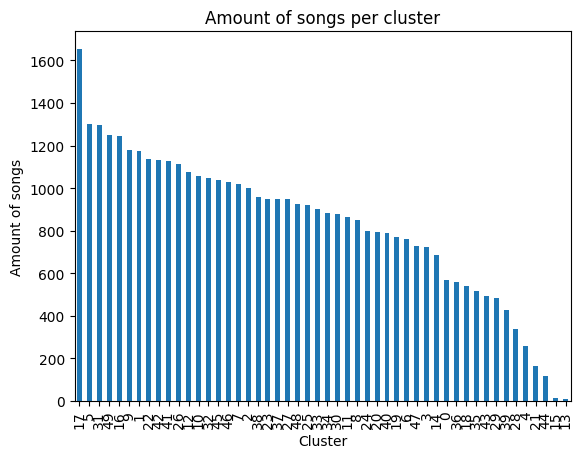

In [22]:
scaled['cluster']= kmodel

data['cluster'].value_counts().plot(kind='bar')
plt.xlabel('Cluster')
plt.ylabel('Amount of songs')
plt.title('Amount of songs per cluster')
plt.show()



In [23]:
#save above info to csv file
data.to_csv('C:/Users/gulie/cluster_data.csv')
df.to_csv('C:/Users/gulie/cluster_df.csv')

In [24]:
feats = ['danceability', 'instrumentalness', 'energy', 'speechiness', 'explicit', 'valence', 'acousticness', 'popularity', 'liveness', 'loudness', 'tempo', 'year']
clues = data[feats]

In [25]:
#sampling cluster
blues_clues = 16
clues = scaled[data['cluster'] == blues_clues]
clues[['title', 'artist', 'cluster', 'popular', 'id']].sort_values('popular').sample(30).sort_values('popular', ascending=False)

,title,artist,cluster,popular,id
1698,Single Ladies (Put a Ring on It),Beyoncé,16,69,5R9a4t5t5O0IsznsrKPVro
669,Collie Man,Slightly Stoopid,16,61,3Zjdqz7eOox8XU0zTCPL4P
1730,Lollipop,Framing Hanley,16,60,49dFv4gH1SeY90FySDOwCE
745,Just Like You,Three Days Grace,16,58,0CA3RxBx2xSQXPfpmUBK1v
5920,The Plot to Bomb the Panhandle,A Day To Remember,16,56,5ozvYiSPEuhUoHDJBDYN9n
32027,You Don't Know Me,Ariana Grande,16,55,3hgl7EQwTutSm6PESsB7gZ
23891,The Lines,Beartooth,16,54,0qLMogpL6n41qhzmFJnhfS
14554,Starstruck,Christopher Wilde,16,54,03teNQu8rWlFnNzF1ULXIq
14830,I'll Be Waiting,Adele,16,53,3QEYmDt1FwOkFBFD74cEzZ
9108,Portions for Foxes,Rilo Kiley,16,53,4yY8JqTOQyi7K4O1QcQtBG


array([[<AxesSubplot: xlabel='danceability', ylabel='danceability'>,
        <AxesSubplot: xlabel='instrumentalness', ylabel='danceability'>,
        <AxesSubplot: xlabel='energy', ylabel='danceability'>,
        <AxesSubplot: xlabel='speechiness', ylabel='danceability'>,
        <AxesSubplot: xlabel='valence', ylabel='danceability'>,
        <AxesSubplot: xlabel='acousticness', ylabel='danceability'>,
        <AxesSubplot: xlabel='popularity', ylabel='danceability'>,
        <AxesSubplot: xlabel='liveness', ylabel='danceability'>,
        <AxesSubplot: xlabel='loudness', ylabel='danceability'>,
        <AxesSubplot: xlabel='tempo', ylabel='danceability'>],
       [<AxesSubplot: xlabel='danceability', ylabel='instrumentalness'>,
        <AxesSubplot: xlabel='instrumentalness', ylabel='instrumentalness'>,
        <AxesSubplot: xlabel='energy', ylabel='instrumentalness'>,
        <AxesSubplot: xlabel='speechiness', ylabel='instrumentalness'>,
        <AxesSubplot: xlabel='valence', ylabe

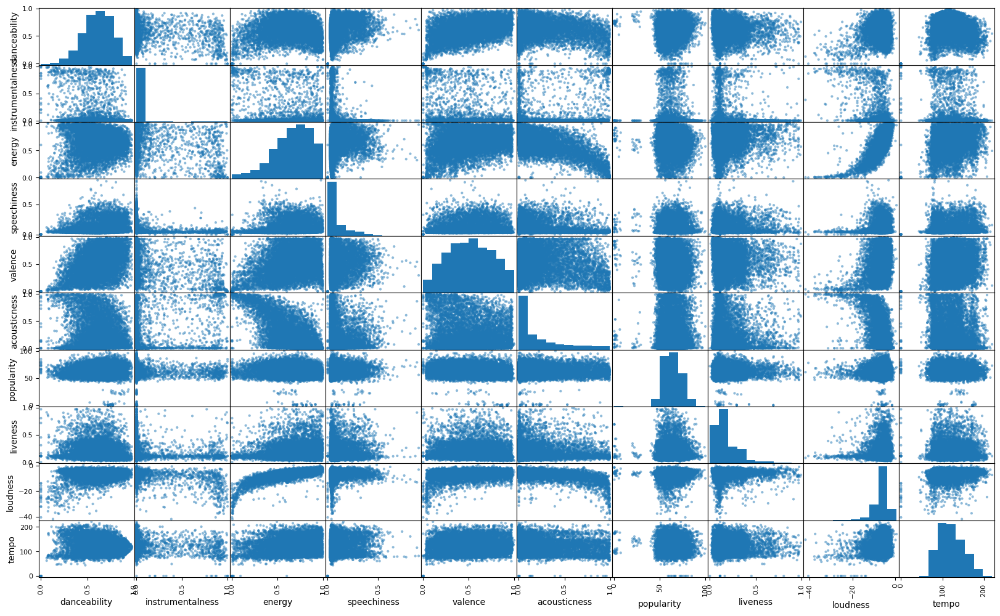

In [26]:
sample_df = data[:10000]
pd.plotting.scatter_matrix(sample_df[['danceability', 'instrumentalness', 'energy', 'speechiness', 'valence', 'acousticness', 'popularity', 'liveness', 'loudness', 'tempo']], figsize=(20,12))

In [27]:
songs = pd.read_csv('C:/Users/gulie/cluster_data.csv')


In [28]:
songs.drop(labels = ['danceability', 'instrumentalness', 'energy', 'speechiness', 'explicit', 'valence', 'acousticness', 'liveness', 'loudness', 'tempo', 'release_date', 'key', 'mode', 'duration_ms'], axis=1, inplace =True)
songs.drop(columns= songs.columns[0], axis=1, inplace=True)
songs.head(10)

,year,artists,id,name,popularity,genres,cluster
0,2000,Coldplay,3AJwUDP919kvQ9QcozQPxg,Yellow,84,"permanent wave, pop",2
1,2000,OutKast,0I3q5fE6wg7LIfHGngUTnV,Ms. Jackson,80,"atl hip hop, dirty south rap, hip hop, rap, so...",34
2,2000,Linkin Park,60a0Rd6pjrkxjPbaKzXjfq,In the End,84,"alternative metal, nu metal, post-grunge, rap ...",41
3,2000,3 Doors Down,6ZOBP3NvffbU4SZcrnt1k6,Kryptonite,78,"alternative metal, nu metal, pop rock, post-gr...",26
4,2000,Eminem,3yfqSUWxFvZELEM4PmlwIR,The Real Slim Shady,80,"detroit hip hop, hip hop, rap",34
5,2000,Disturbed,40rvBMQizxkIqnjPdEWY1v,Down with the Sickness,76,"alternative metal, nu metal, rap metal",34
6,2000,"Nelly, City Spud",3Gf5nttwcX9aaSQXRWidEZ,Ride Wit Me,74,[],33
7,2000,"Eminem, Dido",3UmaczJpikHgJFyBTAJVoz,Stan,78,[],34
8,2000,*NSYNC,62bOmKYxYg7dhrC6gH9vFn,Bye Bye Bye,71,"boy band, dance pop, europop, pop",26
9,2000,Travis Tritt,3oW6SWwGqiZSPTiAp7ZQoH,It's A Great Day To Be Alive,70,"contemporary country, country, country road, c...",17


In [29]:
#songs[:5]=songs[:5].apply(lambda x: x.replace('"', ''))
#songs['genres']=songs.genres.apply(lambda x: x.strip(" ' "))
#songs['genres'] = songs.genres.str.replace('"', '')
#songs.head(10)
songs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41450 entries, 0 to 41449
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   year        41450 non-null  int64 
 1   artists     41450 non-null  object
 2   id          41450 non-null  object
 3   name        41450 non-null  object
 4   popularity  41450 non-null  int64 
 5   genres      41450 non-null  object
 6   cluster     41450 non-null  int64 
dtypes: int64(3), object(4)
memory usage: 2.2+ MB


In [30]:
#Recommender using song IDs
import ipywidgets as widgets
from ipywidgets import widgets, interact
import time
#song_id = input('Type the id of your favorite song/s: ').strip().split(',')
text_out =widgets.Text(disabled = True, description = 'Title:')
text_in = widgets.Text(placeholder='Type song', description='Song:', disabled=False)
button = widgets.Button(description="Enter")
btn = widgets.Button(description = 'Click Me!')
out = widgets.Output()




#button.on_click(bind)
song_id = text_out.value
display(text_in)
#text_out.update
#display()

#display(box)



#text_out.update
#display()
def fun(b):
    song_id = text_in.value
    faves = songs[songs.name.isin([song_id])]
    clust = list(faves['cluster'])
    clustered = {}
    for i in clust:
        clustered[i] = clust.count(i)   
    fave_cluster = [(l, m) for l, m in sorted(clustered.items(), key=lambda item: item[1])][0][0]
    print('Favorite cluster: ', fave_cluster)
    recommendation = songs[songs.cluster == fave_cluster].sort_values('popularity', ascending=False)
    display(recommendation.head(10))

def bind(sender):
    text_out.value = text_in.value

    
    
def results(sender):   
    out.clear_output()

    with out:
        
        while True:
            try:
                fun('b')
                break
            except IndexError:
                print("Invalid song name, try 'Stan' ")
                break

def event(change):
    results(change.new)
#def recommend(c):
    #recommendation = songs[songs.cluster == fave_cluster].sort_values('popularity', ascending=False)
    #display(recommendation.head(10))
#text_out.observe(event, names='value')    
button.on_click(bind)   
display(text_out, button)

Text(value='', description='Song:', placeholder='Type song')

Text(value='', description='Title:', disabled=True)

Button(description='Enter', style=ButtonStyle())

In [31]:
btn.on_click(results) 
#with out:
#    print('Favorite cluster: ', fave_cluster)
#    display(recommendation.head(10))
        
       
        
display(btn,out)


Button(description='Click Me!', style=ButtonStyle())

Output()

# Song Recommendations ↓

## Song Name Hints

#### Press 'Click Me' to get recommendations

#### If no recommendations given, choose a song title from 'Song Name Hints' ↓

#### Type the name of your favorite song in the textbox 'Song', then click 'Enter'

In [32]:
import session_info
session_info.show()

#Recommender using song names
import ipywidgets as widgets
#song_name = input('Type song name: ').strip().split(',')
button = widgets.Button(description='Search', disabled=False,tooltip='Click me')
display(button)

song_name = widgets.Text(placeholder='Type something',description='String:',disabled=False)
display(song_name)
song_name = song_name.value


favors = songs[songs.name.isin([song_name])]

name_clust = list(favors['cluster'])
cluster_name= {}
for j in name_clust:
    cluster_name[j] = name_clust.count(j)

#get most frequent cluster    
name_cluster =[(n, k) for n, k in sorted(cluster_name.items(), key=lambda item: item[1])][0][0]


print('Favorite cluster: ', name_cluster)

song_recs = songs[songs.cluster == name_cluster].sort_values('popularity', ascending=False)

song_recs.head(10)

#Recommender using artists name

artist_name = input('Type artist name: ').strip().split(',')

artist = songs[songs.artists.isin(artist_name)]

artist_clust = list(artist['cluster'])
cluster_artist = {}
for f in artist_clust:
    cluster_artist[f] = artist_clust.count(f)

    
artist_cluster =[(d, g) for d, g in sorted(cluster_artist.items(), key=lambda item: item[1])][0][0]


print('Favorite cluster: ', artist_cluster)

artist_recs = songs[songs.cluster == artist_cluster].sort_values('popularity', ascending=False)

artist_recs.head(10)

## Scatter Plot of Song Clusters

## Heat Map of Song Features

## Number of Songs per Cluster